# Forest Fire Recognition Project - part 3

In this third part the aim is to continue the EBAnO Explanation process:

 -) to investigate the relation between the "cliff" class and the test errors(in the VGG16 part)

 -) to find other test set samples with the same behaviour

 -) to find a motivation behind the misclassification


# EBAnO

As already explained in the FFRp2.ipynb i had to copy the source code of EBAnO to modify some functions that were not compatible with my code.
One part was related to the kind of images used and another was related to one error in analyzing the Network layers to compute the feature maps: in particular, i had to change the name of the convolutional layers since the keras package changed the denomination from  "conv2d" (used in EBAnO) to "conv". 
The method under examination was "_get_conv_layer_indexes".

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from tensorflow.python.keras.preprocessing import image
from tensorflow.keras.applications import vgg16, VGG16, MobileNetV2, mobilenet_v2, EfficientNetB0,efficientnet

In [3]:
from collections import OrderedDict

import numpy as np
from matplotlib.patches import Rectangle
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import normalize

from tensorflow.python import keras
from tensorflow.python.keras import backend as K
from PIL import Image, ImageFilter

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import seaborn as sns
import sys

import pandas as pd


class PerturbationScores:

    col_prediction = "prediction"
    col_prediction_t = "prediction_t"
    col_a_PIR = "a_PIR"
    col_b_PIR = "b_PIR"
    col_PIR = "PIR"
    col_nPIR = "nPIR"
    col_a_PIRP = "a_PIRP"
    col_b_PIRP = "b_PIRP"
    col_PIRP = "PIRP"
    col_nPIRP  = "nPIRP"

    def __init__(self, P_o, P_t, coi):

        self.coi = coi

        self.P_o = P_o
        self.p_o = self.P_o[self.coi]

        if P_t is not None:
            self.P_t = P_t
            self.p_t = self.P_t[self.coi]
        else:
            self.P_t = None
            self.p_t = float('NaN')

        self.PIR = float('NaN')
        self.PIRP = float('NaN')

        self.nPIR = float('NaN')
        self.nPIRP = float('NaN')

        self.a_pir, self.b_pir = float('NaN'), float('NaN')
        self.classes_npir = float('NaN')
        self.w_c_npir = float('NaN')
        self.pirp_coi = float('NaN')
        self.pirp_no_coi = float('NaN')
        self.a_pirp, self.b_pirp = float('NaN'), float('NaN')

    @staticmethod
    def softsign_norm(x):
        x_n = x / (1 + abs(x))
        return x_n

    @staticmethod
    def relu(x):
        if x >= 0:
            return x
        else:
            return 0.0

    @staticmethod
    def _get_a_b(p_o, p_t):

        a = (1 - p_o / p_t)

        if a == float('inf'):
            a = sys.float_info.max
        elif a == float('-inf'):
            a = -sys.float_info.max

        b = (1 - p_t / p_o)

        if b == float('inf'):
            b = sys.float_info.max
        elif b == float('-inf'):
            b = -sys.float_info.max

        return a, b

    @staticmethod
    def compute_influence_relation(p_o, p_t):
        a, b = PerturbationScores._get_a_b(p_o, p_t)
        return (p_t * b) - (p_o * a)

    @staticmethod
    def compute_perturbation_influence_relation(p_o, p_t):
        return PerturbationScores.compute_influence_relation(p_o, p_t)

    @staticmethod
    def compute_perturbation_influence_relation_normalized(p_o, p_t):
        PIR = PerturbationScores.compute_perturbation_influence_relation(p_o, p_t)
        return PerturbationScores.softsign_norm(PIR)

    @staticmethod
    def compute_npir_for_all_classes(P_o, P_t):
        classes_npir = [PerturbationScores.compute_perturbation_influence_relation_normalized(p_o, p_t) for p_o, p_t in zip(P_o, P_t)]
        return classes_npir

    @staticmethod
    def weighted_classes_npir(classes_npir, weights):
        return classes_npir * weights

    @staticmethod
    def pirp_coi(w_c_npir, coi):
        pirp_coi = abs(w_c_npir[coi])
        return pirp_coi

    @staticmethod
    def pirp_no_coi(w_c_npir, coi):
        w_c_npir_no_coi = w_c_npir.copy()
        w_c_npir_no_coi[coi] = 0.0
        w_c_npir_no_coi = [PerturbationScores.relu(wir) for wir in w_c_npir_no_coi]
        pirp_no_coi = sum(w_c_npir_no_coi)
        return pirp_no_coi

    @staticmethod
    def compute_perturbation_influence_relation_precision(P_o, P_t, coi):
        classes_npir = PerturbationScores.compute_npir_for_all_classes(P_o, P_t)

        w_c_npir = PerturbationScores.weighted_classes_npir(classes_npir, P_o)

        pirp_coi = PerturbationScores.pirp_coi(w_c_npir, coi)
        pirp_no_coi = PerturbationScores.pirp_no_coi(w_c_npir, coi)

        return PerturbationScores.compute_influence_relation(pirp_coi, pirp_no_coi)

    @staticmethod
    def compute_perturbation_influence_relation_precision_normalized(P_o, P_t, coi):
        """
        se new_irp_simm > 0 -> la feature è precisa nella la classe in esame \n
        se new_irp_simm = 0 -> la feature non è precisa nella la classe in esame ma impatta anche altre classi \n
        se new_irp_simm < 0 -> la feature non è precisa nella la classe in esame e impatta maggiormente altre classi \n\n

        :param P_o:
        :param P_t:
        :param coi:
        :return:
        """
        pirp = PerturbationScores.compute_perturbation_influence_relation_precision(P_o, P_t, coi)
        return PerturbationScores.softsign_norm(pirp)

    def compute_scores(self):

        if self.P_t is None:
            return self

        self.PIR = PerturbationScores.compute_perturbation_influence_relation(self.p_o, self.p_t)
        self.nPIR = PerturbationScores.compute_perturbation_influence_relation_normalized(self.p_o, self.p_t)

        self.PIRP = PerturbationScores.compute_perturbation_influence_relation_precision(self.P_o, self.P_t, self.coi)
        self.nPIRP = PerturbationScores.compute_perturbation_influence_relation_precision_normalized(self.P_o, self.P_t, self.coi)

        self.a_pir, self.b_pir = PerturbationScores._get_a_b(self.p_o, self.p_t)

        self.classes_npir = PerturbationScores.compute_npir_for_all_classes(self.P_o, self.P_t)

        self.w_c_npir = PerturbationScores.weighted_classes_npir(self.classes_npir, self.P_o)

        self.pirp_coi = PerturbationScores.pirp_coi(self.w_c_npir, self.coi)
        self.pirp_no_coi = PerturbationScores.pirp_no_coi(self.w_c_npir, self.coi)

        self.a_pirp, self.b_pirp = PerturbationScores._get_a_b(self.pirp_coi, self.pirp_no_coi)

        return self

    def get_scores_dict(self):
        scores_dict = OrderedDict()

        scores_dict[self.col_prediction] = float(self.p_o)
        scores_dict[self.col_prediction_t] = float(self.p_t)

        # PIR - Perturbation Influence Relation
        scores_dict[self.col_a_PIR] = float(self.a_pir)
        scores_dict[self.col_b_PIR] = float(self.b_pir)
        scores_dict[self.col_PIR] = float(self.PIR)
        scores_dict[self.col_nPIR] = float(self.nPIR)

        # PIRP - Perturbation Influence Relation Precision
        scores_dict[self.col_a_PIRP] = float(self.a_pirp)
        scores_dict[self.col_b_PIRP] = float(self.b_pirp)
        scores_dict[self.col_PIRP] = float(self.PIRP)
        scores_dict[self.col_nPIRP] = float(self.nPIRP)

        return scores_dict

    def __str__(self):
        return str(self.get_scores_dict())


class LocalExplanation:

    def __init__(self, input_image, class_of_interest, features_map, model, preprocess_func):
        self.input_image = input_image
        self.class_of_interest = class_of_interest
        self.features_map = features_map
        self.model=model
        self.preprocess_func = preprocess_func
        self.cmap = sns.diverging_palette(20, 130, l=60, as_cmap=True)  # 20 -> red, 130 -> green

        self.original_predictions = self.predict_with_model(input_image)
        self.feature_ids = np.unique(self.features_map)

        self.perturbations = {}
        self.numerical_explanation = {}
        self.visual_explanation = None

        self.informativeness = None

    def predict_with_model(self, img):
        if self.preprocess_func:
            input_image_arr = self.preprocess_func(img)
        else:
            raise Exception("Preprocessing function not provided. You should always provide the same preprocess function used on the input image.")

        p = self.model.predict(input_image_arr)
        return p[0]

    @staticmethod
    def _find_centroid(init_x, X, n_iter=10):
        new_x = init_x
        f_X = X

        for i in range(n_iter):
            dist = np.linalg.norm(f_X - new_x, axis=1)
            if f_X[dist < np.mean(dist)].__len__() > 0:
                f_X = f_X[dist < np.mean(dist)]
            else:
                break

            new_x = np.percentile(f_X, 50, interpolation="nearest", axis=0).astype(np.int64)
        return new_x

    @staticmethod
    def _color_palette():
        return (np.array(sns.color_palette("Set3")) * 255).astype(np.uint8)

    @staticmethod
    def _color_rgba(i, alpha=255):
        r, g, b = LocalExplanation._color_palette()[i, :]
        return (r, g, b, alpha)

    def show_features_map(self):

        colored_feature_map = np.zeros((self.features_map.shape[0], self.features_map.shape[0], 4), np.int64)
        coordinates = []

        for f_idx in self.feature_ids:
            feature_map_mask = np.zeros((self.features_map.shape[0], self.features_map.shape[0], 4), np.int64) # init empty mask
            c = self._color_rgba(f_idx - 1) # color

            f = self._get_feature_mask(f_idx)

            x_coors, y_coors = np.where(f == 255)
            y_coor, x_coor = np.percentile(x_coors, 50).astype(int), np.percentile(y_coors, 50).astype(int)

            coors = np.array([x_coors, y_coors]).transpose(1, 0)
            coor = np.array([(x_coor, y_coor)])

            coor = self._find_centroid(coor, coors)
            y_coor, x_coor = coor[0], coor[1]

            # set_color
            feature_map_mask[x_coors, y_coors] = c

            colored_feature_map += feature_map_mask

            coordinates.append((f_idx, x_coor, y_coor, c))

        fig, ax = plt.subplots(figsize=(5, 5), dpi=90)
        fig.tight_layout()
        ax.imshow(colored_feature_map)

        for fid, x_coor, y_coor, c in coordinates:
            ax.text(x_coor, y_coor, f"{fid}", color="black", ha='center', va='center', fontsize=26)

        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_title(f"Features map")

        return ax

    def show_visual_explanation(self, color_bar=True):
        if self.visual_explanation:
            fig, ax = plt.subplots(figsize=(5, 5))
            fig.tight_layout()
            ax.imshow(self.visual_explanation)
            ax.grid(False)
            ax.set_xticks([])
            ax.set_yticks([])

            if color_bar:
                cb_ax = fig.add_axes([1, 0.12, 0.05, 0.8])
                cb = matplotlib.colorbar.ColorbarBase(cb_ax, cmap=self.cmap,
                                       norm=matplotlib.colors.Normalize(vmin=-1, vmax=1),
                                       orientation='vertical')
                cb.set_label(PerturbationScores.col_nPIR)
            return ax
        else:
            raise Exception("Fit explanation first.")

    def show_numerical_explanation(self):

        if self.numerical_explanation:

            _df = pd.DataFrame(self.numerical_explanation).T.sort_index()

            fig, ax = plt.subplots(figsize=(5, 5), dpi=90)
            fig.tight_layout()
            _df[["nPIR", "nPIRP"]].plot(kind="bar", ax=ax, rot=0)
            ax.set_xlabel("Feature id")
            ax.set_title("Class of interest: " + str(self.class_of_interest))
            ax.set_ylim(-1, 1)
            ax.grid(True)

            return ax
        else:
            raise Exception("Fit explanation first.")

    def get_perturbed_input(self, feature_mask):
        im = self.input_image.copy()
        im = PIL.Image.fromarray(im.astype(np.uint8)) ###

        blurred_image = im.filter(ImageFilter.GaussianBlur(10))
        im.paste(blurred_image, mask=feature_mask)
        return im

    def _get_feature_mask(self, f_idx):
        f = self.features_map.reshape(-1).copy()
        f = (f == f_idx).astype(np.uint8) * 255
        f = f.reshape(self.features_map.shape)
        return f

    def get_feature_mask_image(self, f_idx):
        f = self._get_feature_mask(f_idx)
        f_map_img = Image.fromarray(f, mode="L")
        return f_map_img

    def _compute_perturbations(self):

        for f_idx in self.feature_ids:
            feature_mask = self.get_feature_mask_image(f_idx)
            perturbed_image = self.get_perturbed_input(feature_mask)

            self.perturbations[f_idx] = perturbed_image

        return self
    
    @staticmethod
    def _get_visual_explanation_mask(heatmap, cmap):
        norm = matplotlib.colors.Normalize(vmin=-1.0, vmax=1.0)
        colors = plt.cm.ScalarMappable(norm=norm, cmap=cmap).to_rgba(heatmap)
        mask = Image.fromarray((colors*255).astype(np.uint8), mode="RGBA")

        return mask

    @staticmethod
    def _apply_mask(image, heatmap):
        res = Image.blend(image, heatmap, alpha=.85)
        return res

    def _explain(self):

        # numerical explanation
        for f_idx, img_p in self.perturbations.items():
            predictions_p = self.predict_with_model(img_p)
            perturbation_scores = PerturbationScores(self.original_predictions, predictions_p, self.class_of_interest)
            perturbation_scores.compute_scores()

            self.numerical_explanation[f_idx] = perturbation_scores.get_scores_dict()

        # visual explanation
        heatmap_nPIR = np.zeros(self.features_map.shape, np.float32)  # init empty mask
        for f_idx in self.feature_ids:
            f = self._get_feature_mask(f_idx).astype(np.bool)
            f = f * self.numerical_explanation[f_idx][PerturbationScores.col_nPIR]
            heatmap_nPIR += f

        visual_explanation_mask = self._get_visual_explanation_mask(heatmap_nPIR, cmap=self.cmap)
        #self.visual_explanation = self._apply_mask(self.input_image.copy().convert("RGBA"), visual_explanation_mask)
        self.visual_explanation = self._apply_mask(PIL.Image.fromarray(self.input_image.copy().astype(np.uint8)).convert("RGBA"), visual_explanation_mask)

        # Informativeness
        nPIR_values = [scores[PerturbationScores.col_nPIR] for scores in self.numerical_explanation.values()]
        nPIR_values_max = np.max(nPIR_values)
        nPIR_values_min = np.min(nPIR_values)
        self.informativeness = nPIR_values_max - nPIR_values_min

        return self

    def fit_explanation(self):
        return self._compute_perturbations()._explain()

    def get_numerical_explanation(self):
        if self.numerical_explanation:
            _df = pd.DataFrame(self.numerical_explanation).T.sort_index()
            return _df
        else:
            raise Exception("Fit explanation first.")

    def get_visual_explanation(self):
        if self.visual_explanation:
            return self.visual_explanation
        else:
            raise Exception("Fit explanation first.")

    def get_interpretable_feature(self, f_idx):
        if (f_idx < min(self.feature_ids)) or (f_idx > max(self.feature_ids)):
            raise Exception(f"Feature idx '{f_idx}' out of range.")

        feature_mask = self.get_feature_mask_image(f_idx)
        masked_feature = self.input_image.copy()
        masked_feature.putalpha(feature_mask)
        return masked_feature

    def __str__(self):
        return (f"LocalExplanation\
        Class of interest: {self.class_of_interest}\
        # Inf. Feat.: {self.feature_ids.__len__()}\
        {'Informativeness:' + str(round(self.informativeness,2)) if self.informativeness else 'Not fitted'}")


class LocalExplanationModel:

    def __init__(self,  input_image, class_of_interest, model, preprocess_func, max_features=10, k_pca=30, layers_to_analyze=None):
        self.input_image = input_image
        self.class_of_interest = class_of_interest
        self.model = model
        self.model_input_shape = self.model._feed_input_shapes[0][1:3]

        self.k_pca = k_pca
        self.max_features = max_features

        self.preprocess_func = preprocess_func

        # Layers
        self.layer_indexes = self._get_conv_layer_indexes(self.model)
        # print(self.layer_indexes)
        if not layers_to_analyze:
            layers_to_analyze = int(np.log(self.layer_indexes.__len__())/np.log(2))
        else:
            if layers_to_analyze > self.layer_indexes.__len__():
                raise Exception(f"# layers to analyze has to be lower or eqaul to the number of available convolutional layers '{self.layer_indexes.__len__()}'.")

        # print("# layers_to_analyze:", layers_to_analyze)
        self.layer_indexes = self.layer_indexes[-layers_to_analyze:]
        self.layers = [self.model.layers[li].output for li in self.layer_indexes]
        #self.layers = self.get_conv_layer_outputs() #custom change
        self.get_feature_func = K.function([self.model.layers[0].input], self.layers)

        # Explanation
        self.local_explanations = {}
        self.best_explanation = None

    @staticmethod
    def _get_conv_layer_indexes(model):
        layer_indexes = []
        i = 0
        for l in model.layers:
            layer_name = str.lower(l.get_config()["name"])
            if "efficient" in layer_name:
                #custom change
                for subl in l.layers:
                    layer_name = str.lower(subl.get_config()["name"])
                    if (isinstance(subl, keras.layers.Conv2D)) | ("conv" in layer_name):
                        layer_indexes.append(i)
                    i = i + 1
            if (isinstance(l, keras.layers.Conv2D)) | ("conv" in layer_name):
                layer_indexes.append(i)
            i = i + 1
        
        return layer_indexes

    #custom function
    def get_conv_layer_outputs(self):
        conv_out=[]
        for l in self.model.layers:
            layer_name = str.lower(l.get_config()["name"])
            
            if "eff" in layer_name:
              conv_out = [l.layers[li].output for li in self.layer_indexes]
            
              
        
        return conv_out

    def get_model_features(self, image_arr):
        #return self.get_feature_func([image_arr, 0]) #custom change
        #print(image_arr)
        return self.get_feature_func([image_arr])

    def get_hypercolumns(self, input_image):
        feature_maps = self.get_model_features(input_image)
        

        hypercolumns = []
        count = 0
        for convmap in feature_maps:

            reshaped_convmap = convmap[0].transpose((2, 1, 0))

            for fmap in reshaped_convmap:
                upscaled = np.array(Image.fromarray(fmap).resize(self.model_input_shape, Image.BILINEAR))
                hypercolumns.append(upscaled)
            count = count + 1

        hypercolumns = np.asarray(hypercolumns)
        
        return hypercolumns

    def _features_reduction(self, X):
        pca = PCA(n_components=self.k_pca, copy=False)
        X_r = pca.fit_transform(X)
        return X_r

    def extract_hypercolumns(self, input_image, verbose=False):
        x = self.preprocess_func(input_image)

        hc = self.get_hypercolumns(x)
        #print(self.model_input_shape[0])
        #print(self.model_input_shape[1])
        hc_t = hc.transpose([2, 1, 0]).reshape(self.model_input_shape[0] * self.model_input_shape[1], -1)  # e.g. 224*224 = 50176  color transpose, tensor reshape

        hc_r = self._features_reduction(hc_t)

        return hc_r

    def compute_features_map(self, hc, n_features):
        hc_n = normalize(hc, norm='l2', axis=1)
        kmeans_model = KMeans(n_clusters=n_features, max_iter=300, random_state=42)
        features_labels = kmeans_model.fit_predict(hc_n)
        features_map = features_labels.reshape(self.model_input_shape[0], self.model_input_shape[1]).astype(np.uint8)
        features_map += 1
        return features_map

    def fit_explanation(self, verbose=False):

        hc = self.extract_hypercolumns(self.input_image, verbose=verbose)

        for n_f in range(2, self.max_features+1):
            features_map = self.compute_features_map(hc, n_f)
            print(f"> Computing explanation with '{n_f}' features...") if verbose else None

            local_expl_model = LocalExplanation(self.input_image, self.class_of_interest, features_map, self.model,
                                                preprocess_func=self.preprocess_func)

            local_expl_model.fit_explanation()
            self.local_explanations[n_f] = local_expl_model

        self.best_explanation = self.compute_best_explanation()

        return self

    def compute_best_explanation(self):
        if self.local_explanations.items().__len__() == 0:
            raise Exception("Fit explanation first.")

        return max(self.local_explanations.values(), key=lambda x: x.informativeness)


class ClassGlobalExplanationModel:

    def __init__(self, input_images, class_of_interest, model, preprocess_func, max_features=10, k_pca=30, layers_to_analyze=None):
        self.model = model
        self.preprocess_func=preprocess_func
        self.max_features = max_features
        self.k_pca = k_pca
        self.layers_to_analyze = layers_to_analyze

        self.input_images = input_images
        self.class_of_interest = class_of_interest
        self.local_explanation_models = {}
        self.global_explanation = []

    def fit_explanation(self, verbose=False):
        for idx, im in enumerate(self.input_images):
            local_expl_model = LocalExplanationModel(im, self.class_of_interest, self.model, self.preprocess_func,
                                                     max_features=self.max_features, k_pca=self.k_pca,
                                                     layers_to_analyze=self.layers_to_analyze)

            local_expl_model = local_expl_model.fit_explanation()
            self.local_explanation_models[idx] = local_expl_model.best_explanation

        for im_idx, l_expl in self.local_explanation_models.items():
            for f_idx in l_expl.feature_ids:
                f_im = l_expl.get_interpretable_feature(f_idx)
                f_score = l_expl.get_numerical_explanation().loc[f_idx, [PerturbationScores.col_nPIR, PerturbationScores.col_nPIRP]].to_dict()
                self.global_explanation.append({"image_id":im_idx, "feature_id":f_idx, "feature_img": f_im, "feature_scores": f_score})

        return self

    @staticmethod
    def _imscatter(x, y, image, ax=None, zoom=1):
        if ax is None:
            ax = plt.gca()

        im = OffsetImage(image, zoom=zoom)
        x, y = np.atleast_1d(x, y)
        artists = []
        for x0, y0 in zip(x, y):
            ab = AnnotationBbox(im, (x0, y0), xycoords='data', frameon=True)
            artists.append(ax.add_artist(ab))
            ax.scatter(x0, y0)
        ax.update_datalim(np.column_stack([x, y]))
        ax.autoscale()
        return artists

    def show_global_explanation(self):
        if self.global_explanation.__len__() == 0:
            raise Exception("Fit explanation first.")

        t_size = (100, 100)

        f_p_report = self.global_explanation.copy()
        f_p_report = sorted(f_p_report, key=lambda x: np.abs(x["feature_scores"][PerturbationScores.col_nPIR]))

        # KDE plot
        lm = sns.jointplot([fp["feature_scores"][PerturbationScores.col_nPIR] for fp in f_p_report],
                           [fp["feature_scores"][PerturbationScores.col_nPIRP] for fp in f_p_report],
                           kind="kde", height=8)
        ax = lm.ax_joint
        ax.clear()

        # Image plot
        for g_expl in f_p_report:
            f_im = g_expl["feature_img"]
            f_score = g_expl["feature_scores"]

            t_im = f_im.copy()
            t_im = t_im.resize(t_size, Image.ANTIALIAS)
            t_im = np.array(t_im)

            self._imscatter(f_score[PerturbationScores.col_nPIR], f_score[PerturbationScores.col_nPIRP], t_im, ax=ax, zoom=1)

        ax.set_ylim(-1.25, 1.25)
        ax.set_xlim(-1.15, 1.15)
        ax.set_xlabel("nPIR")
        ax.set_ylabel("nPIRP")
        lm.ax_marg_x.set_title("Class of interest:" + str(self.class_of_interest))

        ax.axvline(0.0, 0.0, c='black')
        ax.axhline(0.0, 0.0, c='black')

        # Create a Rectangle patch
        rect1 = Rectangle((-1.15, -1.25), 0.15, 2.5, linewidth=0, edgecolor='r', facecolor='gray', alpha=0.5)
        rect2 = Rectangle((1.0, -1.25), 0.15, 2.5, linewidth=0, edgecolor='r', facecolor='gray', alpha=0.5)

        rect3 = Rectangle((-1.0, 1.0), 2.0, 0.25, linewidth=0, facecolor='gray', alpha=0.5)
        rect4 = Rectangle((-1.0, -1.25), 2.0, 0.25, linewidth=0, facecolor='gray', alpha=0.5)

        # Add the patch to the Axes
        ax.add_patch(rect1)
        ax.add_patch(rect2)
        ax.add_patch(rect3)
        ax.add_patch(rect4)

        ax.grid(True)

        return ax


In [4]:
def load_image(image_url, target_size):
    img = image.load_img(image_url, target_size=target_size)
    return img

def preprocess_function(img, model_preproc):
    x = image.img_to_array(img)
    x = np.expand_dims(x.astype("uint8"), axis=0)
    return model_preproc(x)

# Test set error Analysis

In [5]:
VGG16_model = VGG16(include_top=True, weights='imagenet', classes=1000)

target_size = VGG16_model._feed_input_shapes[0][1:3]
print("target_size:", target_size)
VGG16_model

553476096/553467096 [==============================] - 6s 0us/step
target_size: (224, 224)


In [6]:
import cv2
import PIL
img_a = cv2.imread("/content/drive/MyDrive/errors/a.jpg")
img_b = cv2.imread("/content/drive/MyDrive/errors/b.png")

In [7]:
img_a=cv2.cvtColor(img_a, cv2.COLOR_BGR2RGB)
img_a = cv2.resize(img_a, (224,224), interpolation=cv2.INTER_LINEAR)

img_b=cv2.cvtColor(img_b, cv2.COLOR_BGR2RGB)
img_b = cv2.resize(img_b, (224,224), interpolation=cv2.INTER_LINEAR)


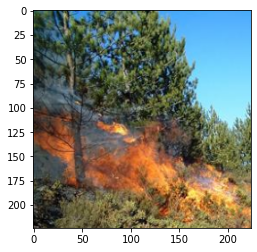

In [8]:
plt.imshow(img_a)

In [9]:
# Preprocess image
x = preprocess_function(img_a, vgg16.preprocess_input)

# Predict
predictions = VGG16_model.predict(x)

# Show top-10 predictions
top_preds = 10
decoded_predictions = vgg16.decode_predictions(predictions, top=top_preds)[0]
preds_indexes = np.argsort(predictions[0])[::-1][:top_preds] # Get indexes of top-10 predictions
pd.DataFrame(decoded_predictions, columns=["WNID", "Class name", "Prob."], index=preds_indexes).style.background_gradient()

49152/35363 [=========================================] - 0s 0us/step


,WNID,Class name,Prob.
979,n09468604,valley,0.066515
972,n09246464,cliff,0.040366
975,n09332890,lakeside,0.035199
649,n03743016,megalith,0.033530
970,n09193705,alp,0.032171
425,n02793495,barn,0.031917
974,n09288635,geyser,0.025211
980,n09472597,volcano,0.022273
976,n09399592,promontory,0.020339
825,n04326547,stone_wall,0.019263


In [10]:
def EBAnO_explanation(image,coi): #coi: classofinterest
  ebano_local = LocalExplanationModel(image, coi,
                                        VGG16_model,
                                  preprocess_func=lambda x: preprocess_function(x, vgg16.preprocess_input),
                                  max_features=5,#5
                                  layers_to_analyze=10)

  ebano_local.fit_explanation(verbose=True)
  return ebano_local


In [11]:
ebano_a = EBAnO_explanation(img_a,972)

> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


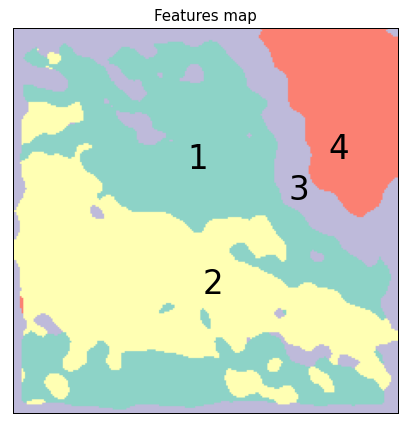

In [12]:
ebano_a.best_explanation.show_features_map()
plt.show()
plt.close()

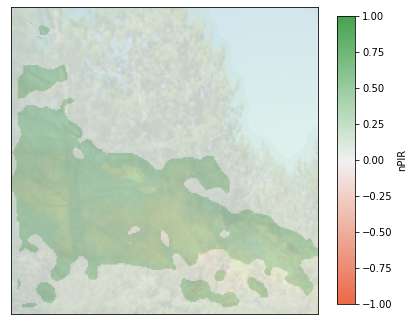

In [13]:
ebano_a.best_explanation.show_visual_explanation()
plt.show()
plt.close()

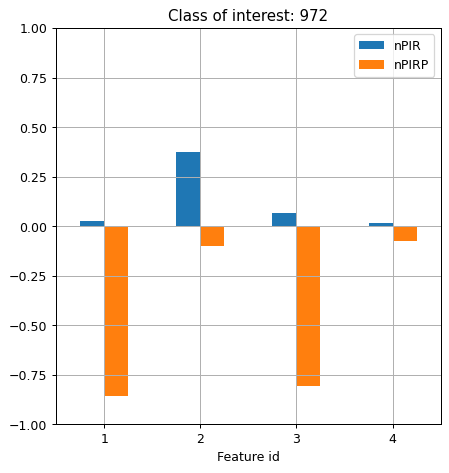

In [14]:
ebano_a.best_explanation.show_numerical_explanation()
plt.show()
plt.close()

In [15]:
# Preprocess image
x = preprocess_function(img_b, vgg16.preprocess_input)

# Predict
predictions = VGG16_model.predict(x)

# Show top-10 predictions
top_preds = 10
decoded_predictions = vgg16.decode_predictions(predictions, top=top_preds)[0]
preds_indexes = np.argsort(predictions[0])[::-1][:top_preds] # Get indexes of top-10 predictions
pd.DataFrame(decoded_predictions, columns=["WNID", "Class name", "Prob."], index=preds_indexes).style.background_gradient()

,WNID,Class name,Prob.
972,n09246464,cliff,0.164623
825,n04326547,stone_wall,0.052197
525,n03160309,dam,0.046112
671,n03792782,mountain_bike,0.031932
880,n04509417,unicycle,0.029409
839,n04366367,suspension_bridge,0.025813
703,n03891251,park_bench,0.021000
888,n04532670,viaduct,0.019303
347,n02410509,bison,0.017066
472,n02951358,canoe,0.015956


In [16]:
ebano_b = EBAnO_explanation(img_b,972)

> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


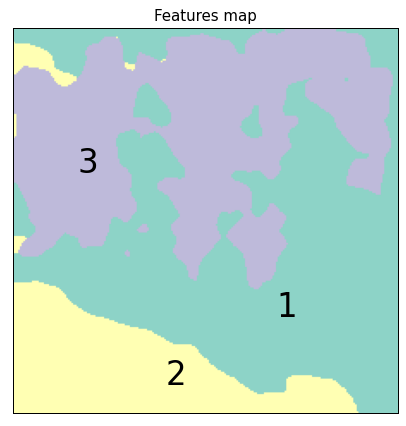

In [17]:
ebano_b.best_explanation.show_features_map()
plt.show()
plt.close()

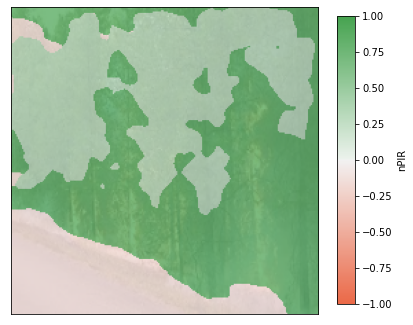

In [18]:
ebano_b.best_explanation.show_visual_explanation()
plt.show()
plt.close()

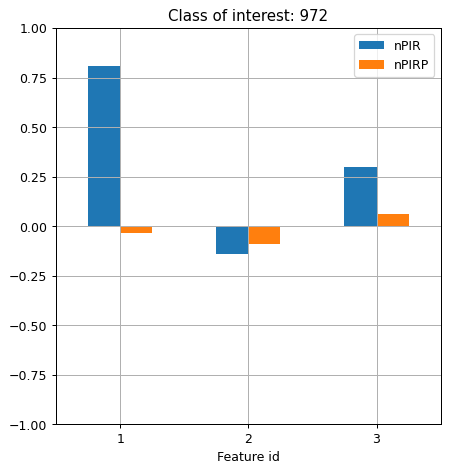

In [19]:
ebano_b.best_explanation.show_numerical_explanation()
plt.show()
plt.close()

# Global Test set Analysis

Analizzando col tool EBAnO gli incendi non riconosciuti dal modello sviluppato, è risultata palese, in due di questi, una correlazione tra la parte segmentata dal tool relativa alla fiamme e la classe "cliff" (scogliera). Per cui in questa sezione l'idea è di guardare alle altre immagini relative a incendi e vedere che tipo di correlazione c'è con la classe "cliff". 


*   estrarre dal test set le immagini taggate con "fire"
*   vedere quali di queste ha "cliff" tra le top predictions

*   vedere se la regione caratterizzata da fiamme è correlata alla classe.





In [20]:
!unzip drive/MyDrive/ForestFireDataset.zip

Archive:  drive/MyDrive/ForestFireDataset.zip
   creating: ForestFireDataset/
   creating: ForestFireDataset/fire_images/
  inflating: ForestFireDataset/fire_images/1.jpg  
  inflating: ForestFireDataset/fire_images/10.jpg  
  inflating: ForestFireDataset/fire_images/100.jpg  
  inflating: ForestFireDataset/fire_images/101.jpg  
  inflating: ForestFireDataset/fire_images/102.jpg  
  inflating: ForestFireDataset/fire_images/103.jpg  
  inflating: ForestFireDataset/fire_images/104.jpg  
  inflating: ForestFireDataset/fire_images/105.png  
  inflating: ForestFireDataset/fire_images/106.jpg  
  inflating: ForestFireDataset/fire_images/107.jpg  
  inflating: ForestFireDataset/fire_images/108.jpg  
  inflating: ForestFireDataset/fire_images/109.jpg  
  inflating: ForestFireDataset/fire_images/11.jpg  
  inflating: ForestFireDataset/fire_images/110.jpg  
  inflating: ForestFireDataset/fire_images/12.jpg  
  inflating: ForestFireDataset/fire_images/13.jpg  
  inflating: ForestFireDataset/fire_

In [21]:
import tensorflow as tf

H,W = 224,224

dataset = tf.keras.preprocessing.image_dataset_from_directory('./ForestFireDataset', shuffle=True, seed=42, image_size=(H, W),batch_size=1)

ds=dataset.unbatch()

DATASET_SIZE=4872 

train_size = int(0.8 * DATASET_SIZE)
val_size = int(0.1 * DATASET_SIZE)
test_size = int(0.1 * DATASET_SIZE)


train_dataset = ds.take(train_size)
test_dataset = ds.skip(train_size)
val_dataset = test_dataset.skip(test_size)
test_dataset = test_dataset.take(test_size)

Found 4872 files belonging to 2 classes.


In [22]:
import matplotlib.pyplot as plt
fires=[]
for el,label in test_dataset:
    if int(label) == 0:
      fires.append([el,label])

é stato scelto come modello "VGG16" in quanto analizzare EfficientNetB0 con EBAnO richiedeva troppo consumo di RAM. In particolare, per ottenere una segmentazione discreta con EfficientNet, la funzione "LocalExplanationModel" richiedeva troppi layer da analizzare per calcolare le hypercolumns.

In [23]:
def EBAnO_explanation(image,coi): #coi: classofinterest
  ebano_local = LocalExplanationModel(image, coi,
                                        VGG16_model,
                                  preprocess_func=lambda x: preprocess_function(x, vgg16.preprocess_input),
                                  max_features=5,
                                  layers_to_analyze=10)

  ebano_local.fit_explanation(verbose=True)
  return ebano_local


In [24]:
def find(model,coi,top_preds,fires):
  """
  This function returns a list of images which have 
  the desired class of interest("coi") in their top "top_preds"
  predictions obtained with the classifier ("model").

  """
  res=[]
  for el,_ in fires:
    #el = np.expand_dims(el, axis=0)
    x = preprocess_function(el, tf.keras.applications.vgg16.preprocess_input)

    predictions=model.predict(x) #prediction
    preds_indexes = np.argsort(predictions[0])[::-1][:top_preds] #top predictions
    

    if coi in preds_indexes:
      res.append(el)
  print('Number of images found:',len(res))
  
  return res


def visualize_correlation(coi,L):
  """
  Function to visualize feature maps from the list of images
  related to the coi. In particular, EBAnO segments the image 
  and is able to show how the segmented region is related to 
  the coi. 
  Stronger the green color, stronger the relation to the class.
  (L is obtained with the "find" function.)
  """
  for el in L:
    print(el.shape)
    plt.imshow(el.astype("uint8")) #visualizing the orginal image
    #EBAnO application to visualize feature maps 
    el = np.expand_dims(el, axis=0)

    ebano_el=EBAnO_explanation(el[0],coi)

    ebano_el.best_explanation.show_features_map()
    plt.show()
    plt.close()

    ebano_el.best_explanation.show_visual_explanation()
    plt.show()
    plt.close

Which fire images are related to "cliff" class (972 in ImageNet)?

In [25]:
res = find(VGG16_model,972,5,fires)

Number of images found: 15


Let's look at their EBAnO explanation: 

(224, 224, 3)
> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


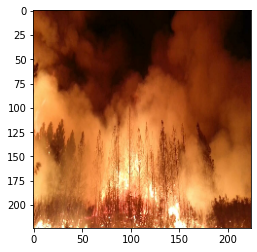

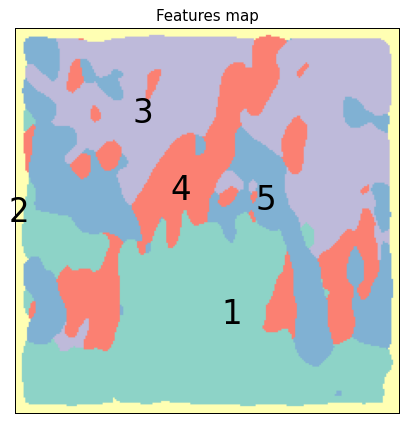

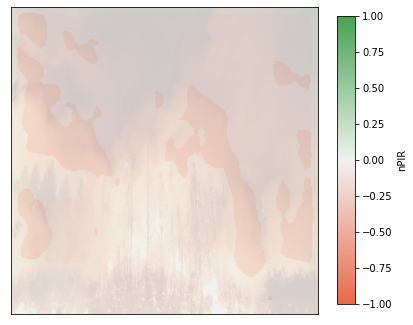

(224, 224, 3)
> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


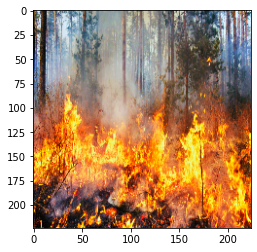

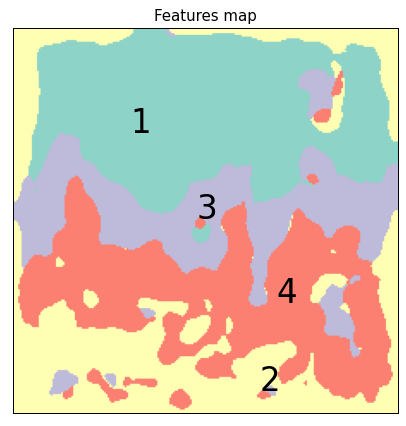

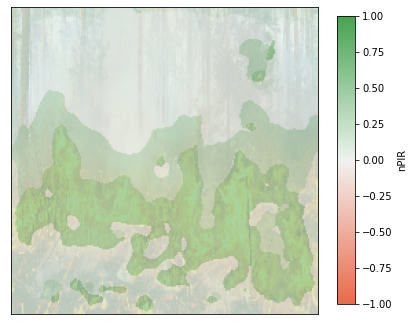

(224, 224, 3)
> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


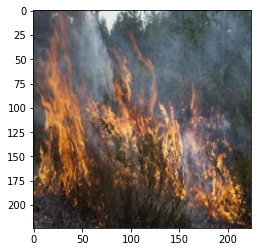

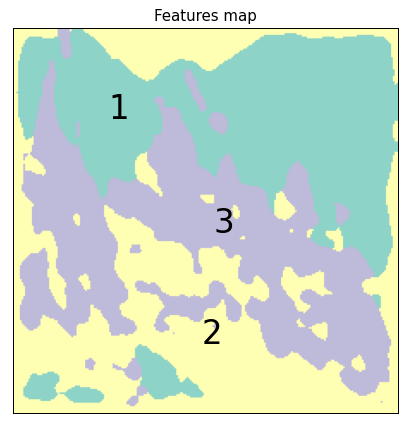

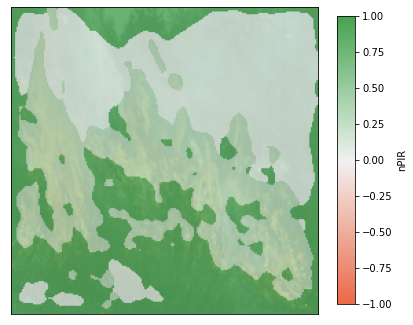

(224, 224, 3)
> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


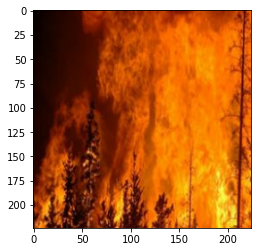

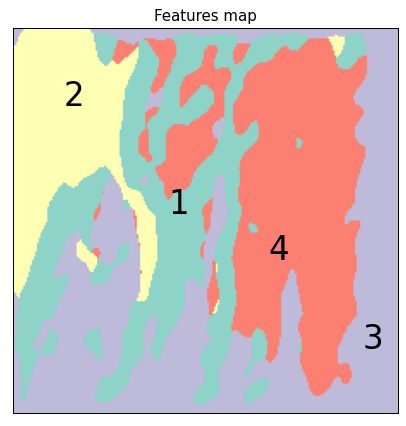

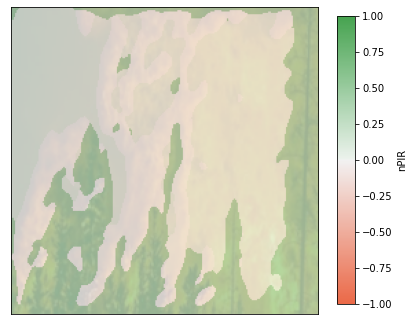

(224, 224, 3)
> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


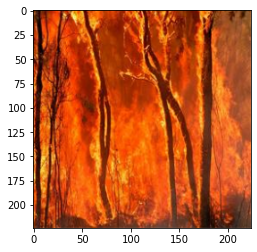

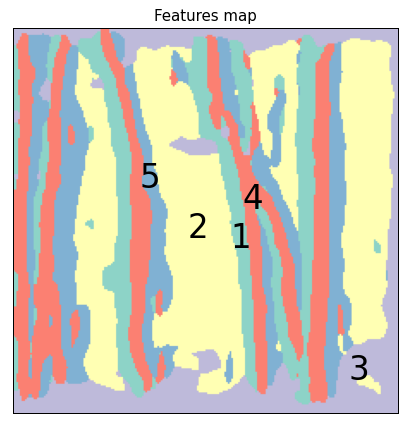

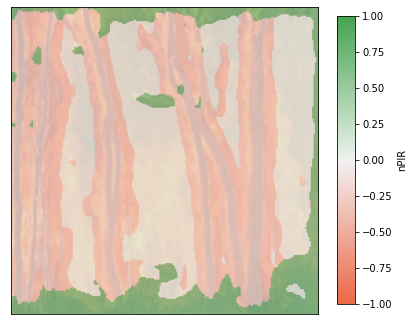

(224, 224, 3)
> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


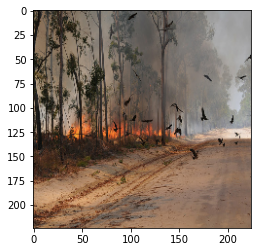

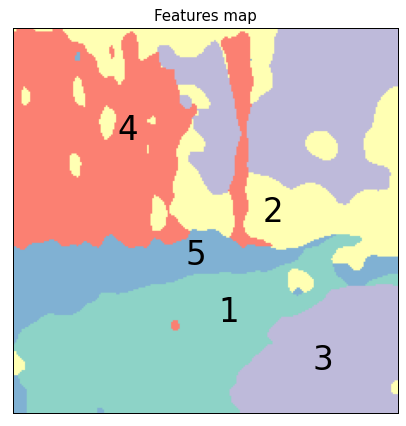

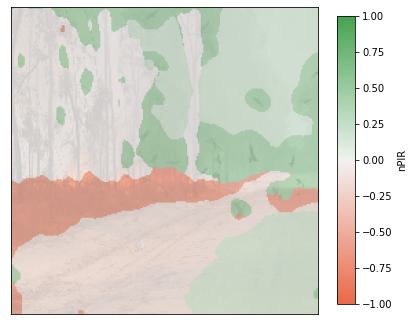

(224, 224, 3)
> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


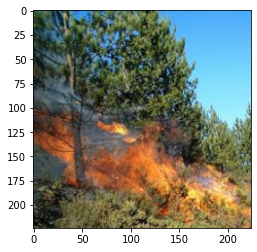

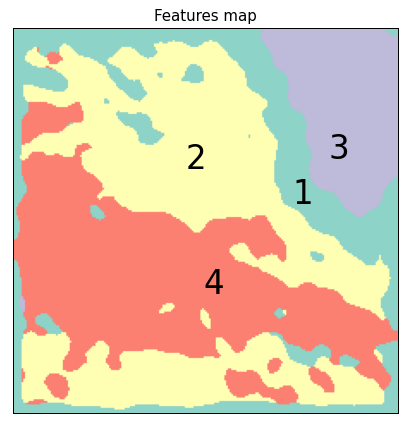

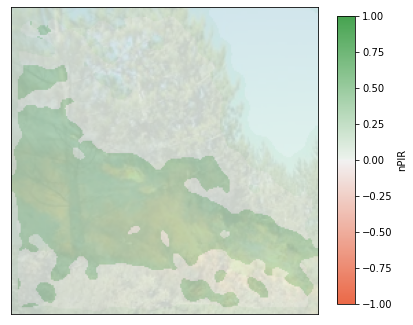

(224, 224, 3)
> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


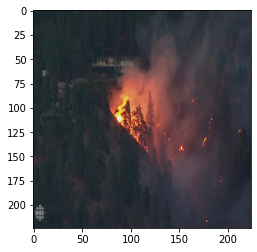

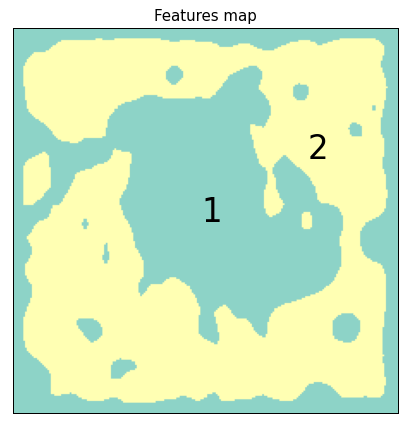

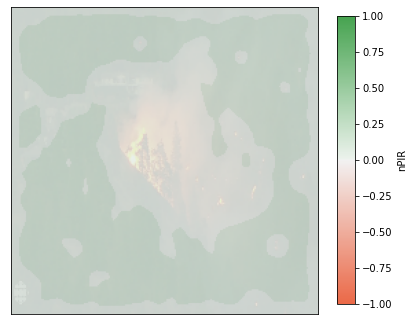

(224, 224, 3)
> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


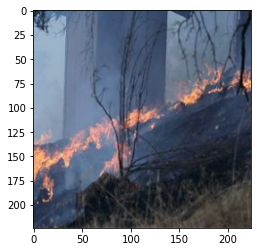

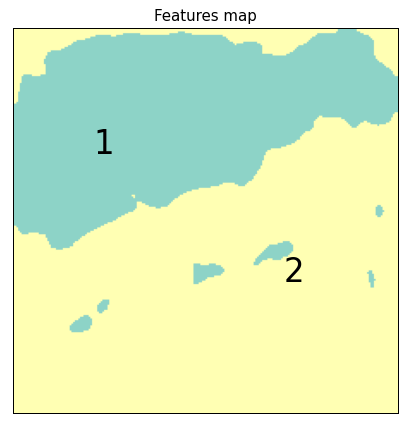

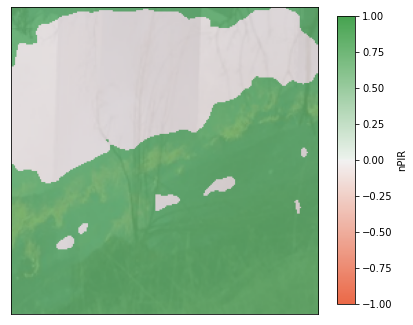

(224, 224, 3)
> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


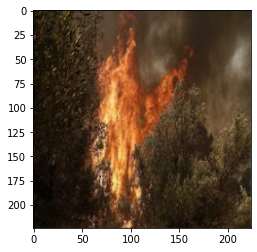

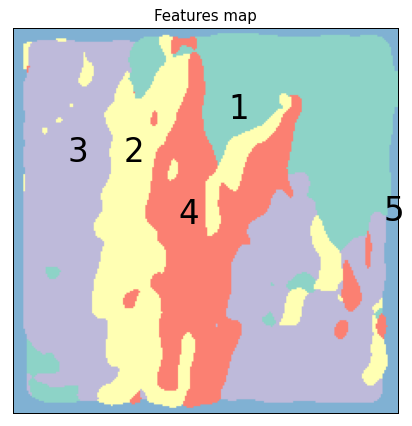

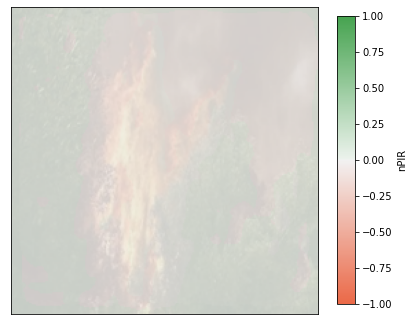

(224, 224, 3)
> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


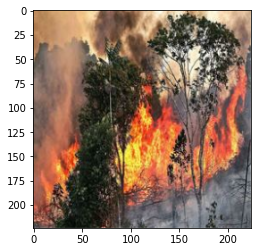

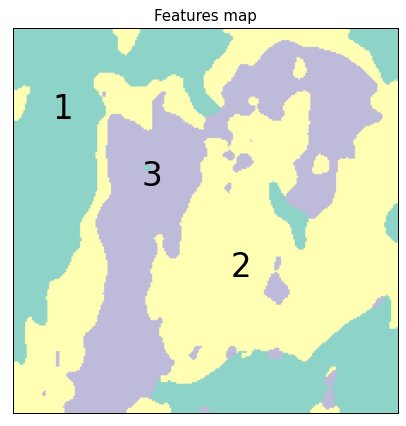

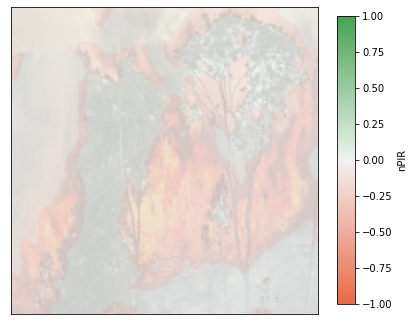

(224, 224, 3)
> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


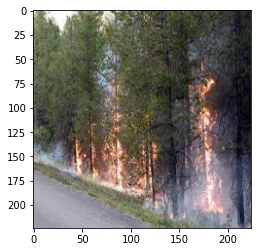

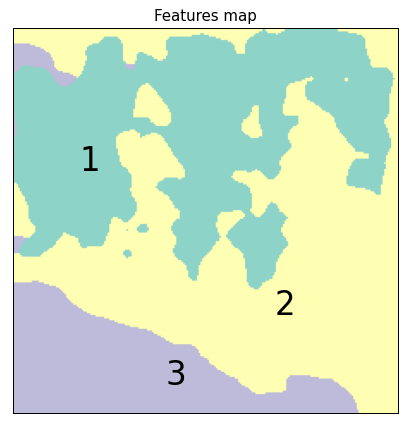

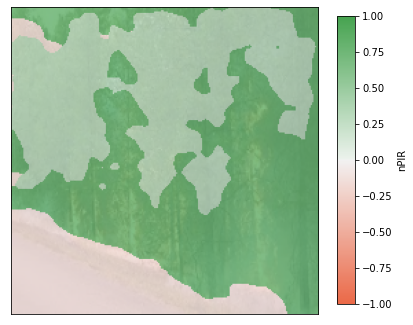

(224, 224, 3)
> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


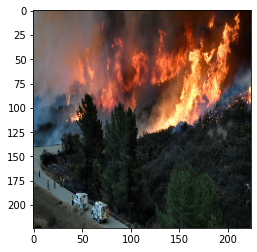

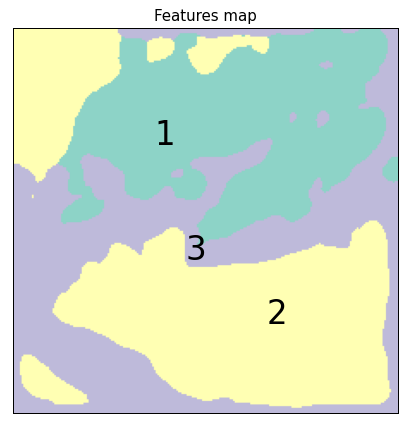

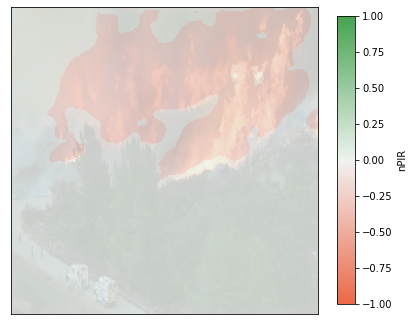

(224, 224, 3)
> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


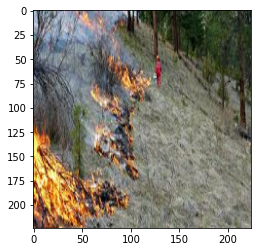

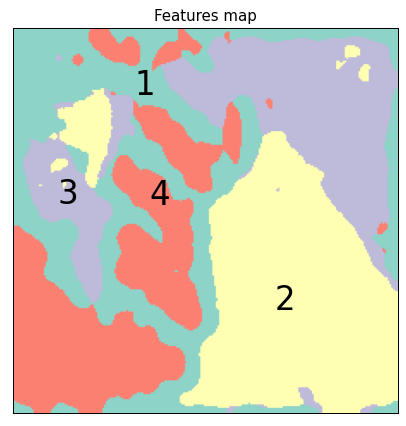

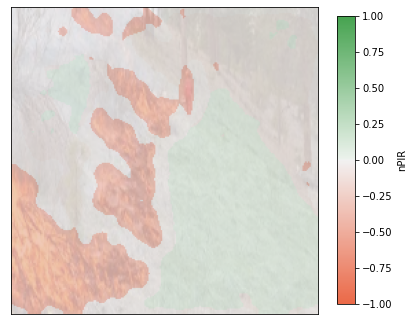

(224, 224, 3)
> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


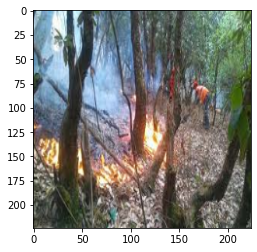

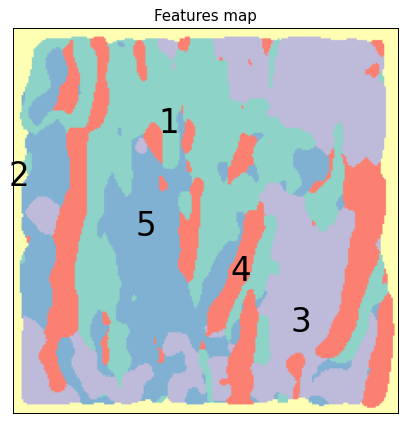

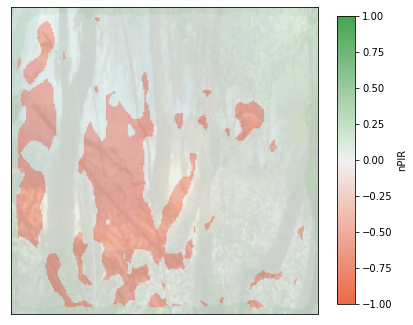

In [26]:
from tensorflow.python.ops.numpy_ops import np_config
np_config.enable_numpy_behavior()
visualize_correlation(972,res)

Top four prediction from test set:
980: volcano
974: geyser
862: torch
562: fountain

In [52]:
arr=[]
for el,_ in fires:
  top_preds=5
  x = preprocess_function(el, tf.keras.applications.vgg16.preprocess_input)
  predictions=VGG16_model.predict(x) #prediction
  decoded_predictions = vgg16.decode_predictions(predictions, top=top_preds)[0]

  preds_indexes = np.argsort(predictions[0])[::-1][:top_preds] #top predictions
  flag=False
  for idx in preds_indexes:
    if idx in [980,974,862,562] or idx==972:
      flag=True
  if flag==False:
    decoded_predictions = vgg16.decode_predictions(predictions, top=top_preds)[0]
    print(decoded_predictions)
    plt.imshow(el.astype("uint8")) #visualizing the orginal image
    plt.show()
    plt.close()

    arr.append(el)
print('Number of samples without toppreds and cliff',len(arr))

Number of samples without toppreds 17


(224, 224, 3)
> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


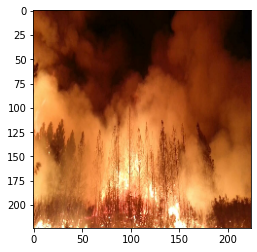

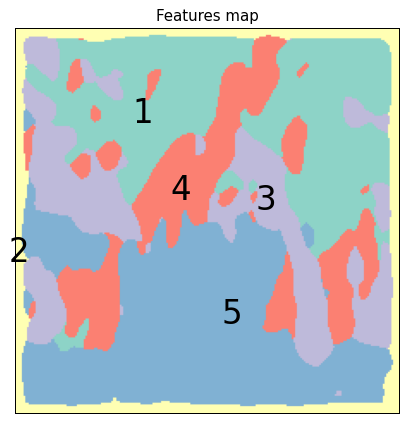

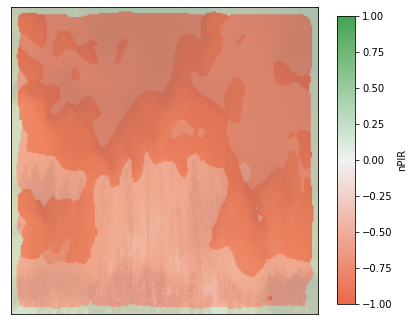

(224, 224, 3)
> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


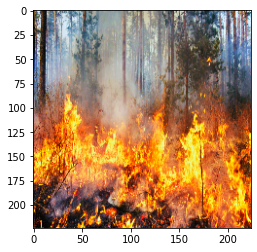

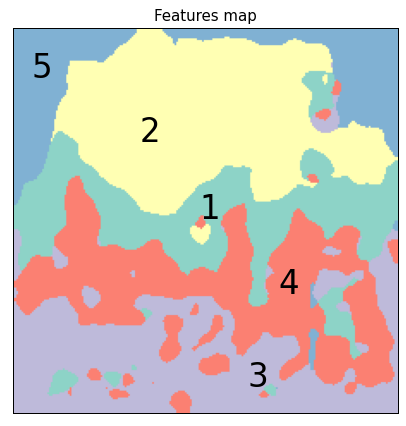

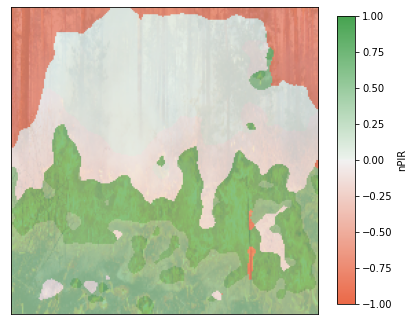

(224, 224, 3)
> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


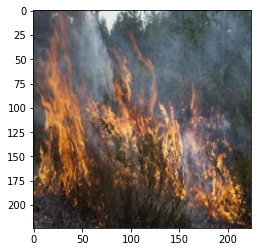

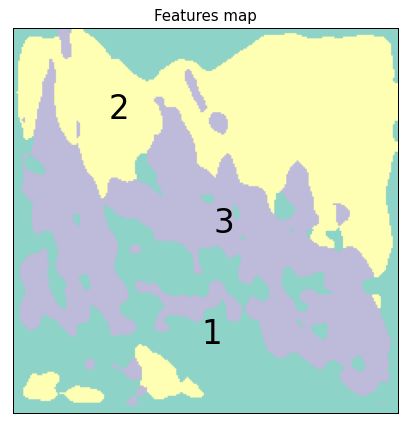

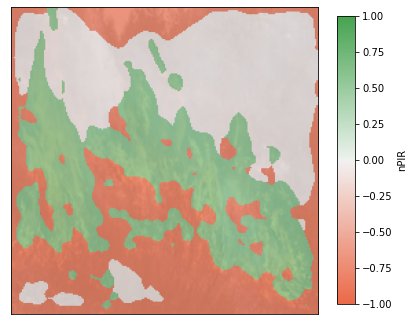

(224, 224, 3)
> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


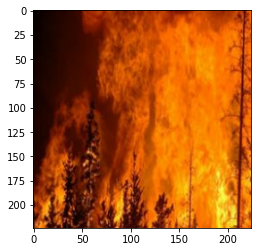

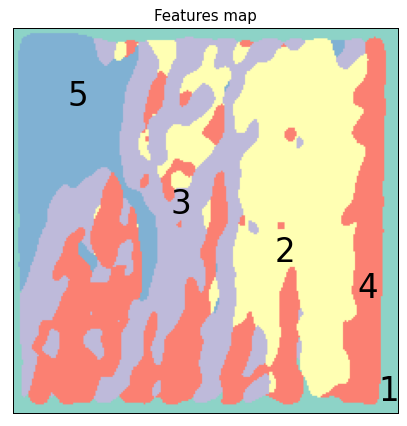

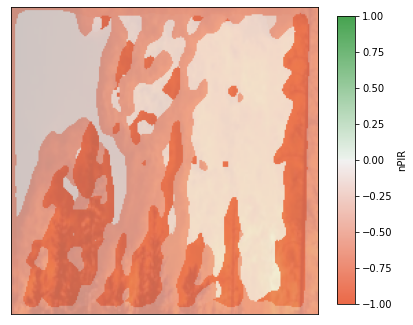

(224, 224, 3)
> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


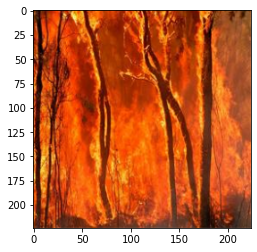

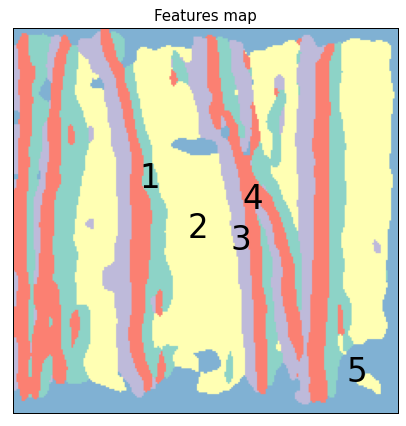

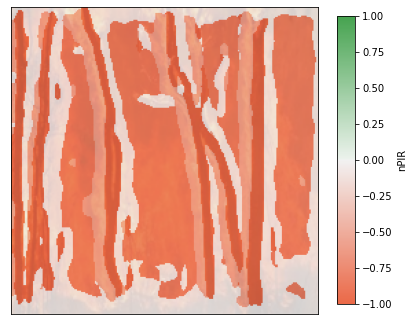

(224, 224, 3)
> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


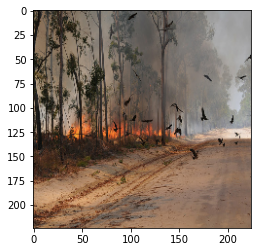

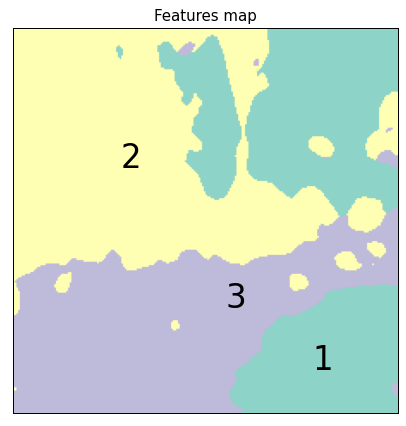

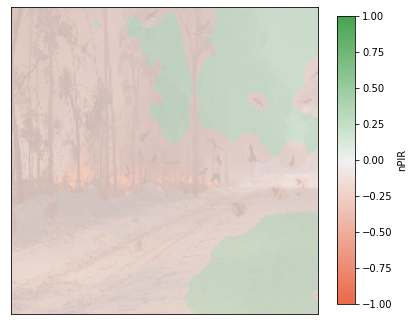

(224, 224, 3)
> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


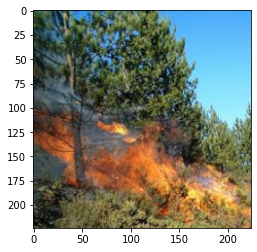

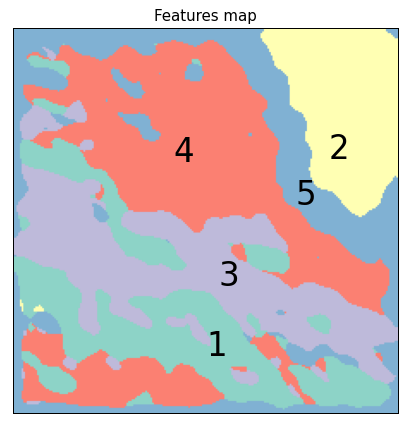

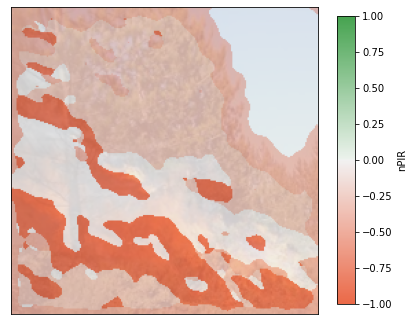

(224, 224, 3)
> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


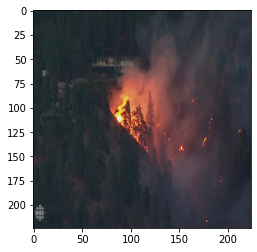

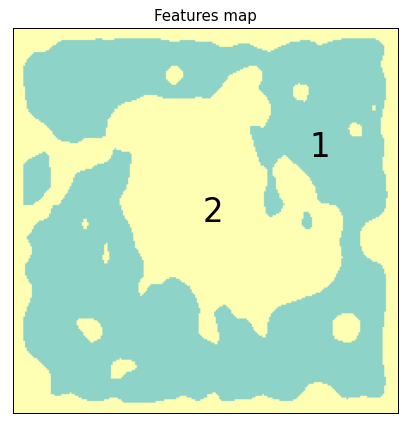

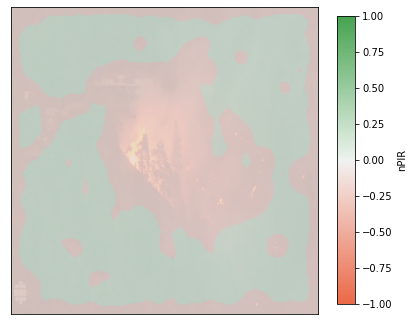

(224, 224, 3)
> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


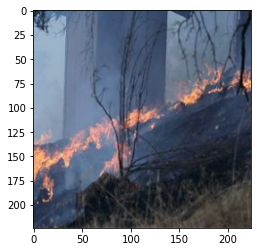

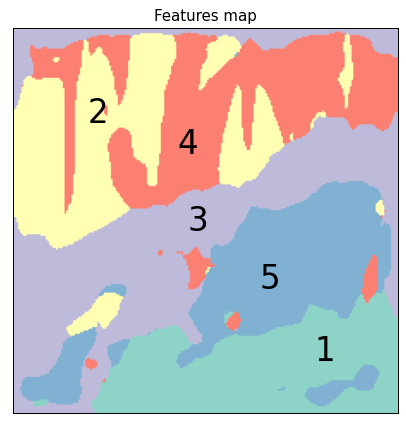

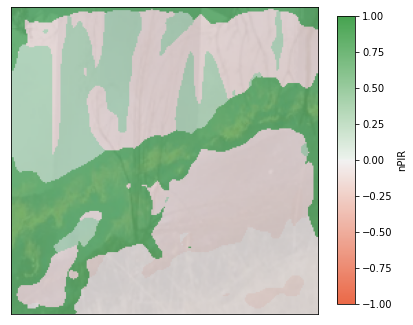

(224, 224, 3)
> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


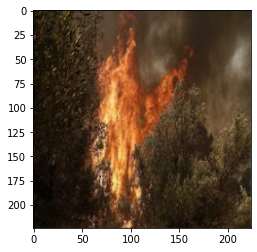

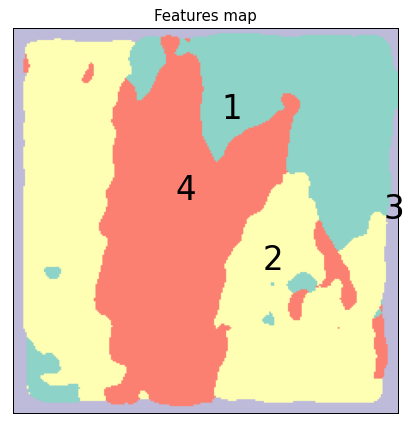

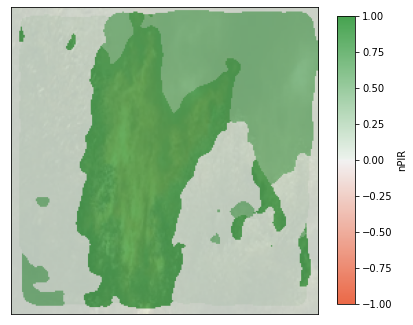

(224, 224, 3)
> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


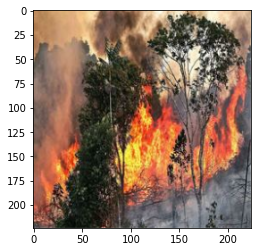

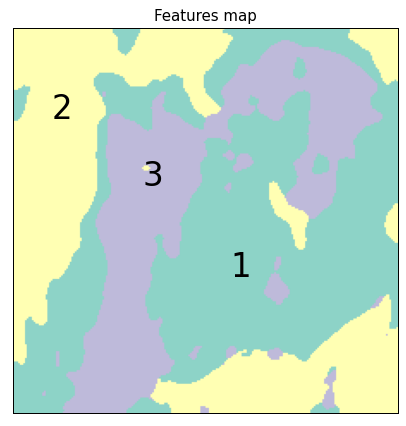

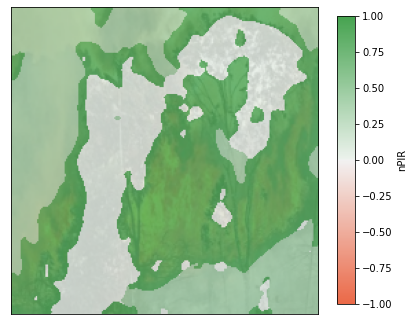

(224, 224, 3)
> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


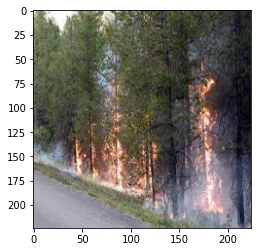

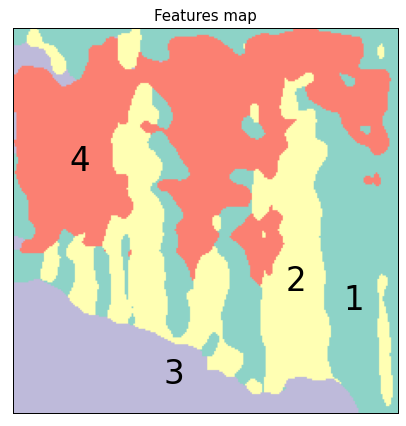

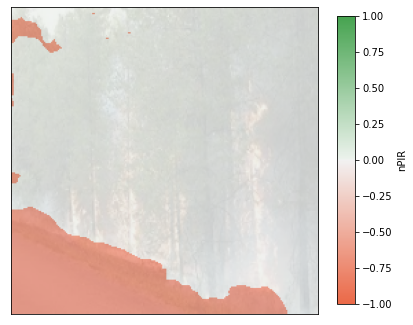

(224, 224, 3)
> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


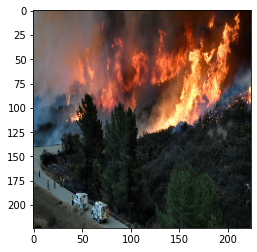

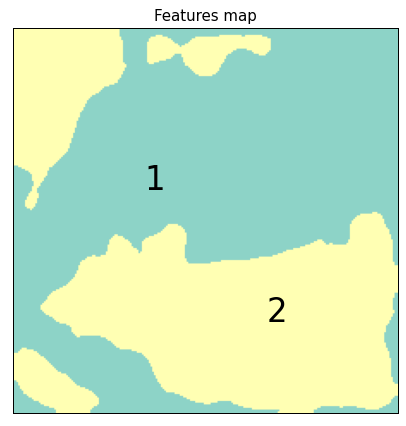

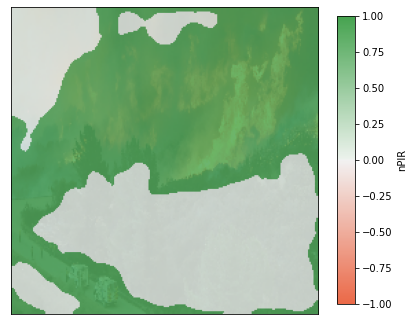

(224, 224, 3)
> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


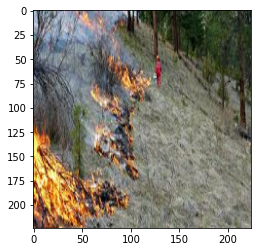

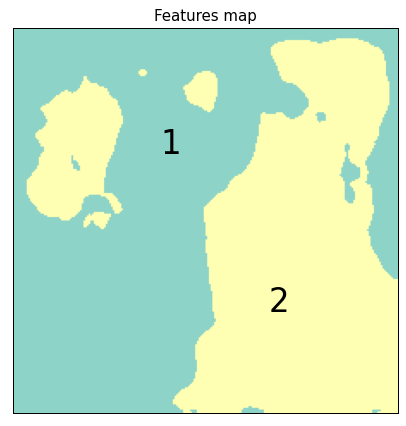

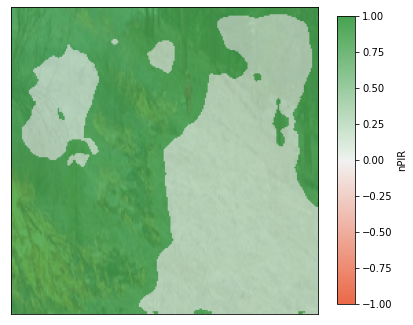

(224, 224, 3)
> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


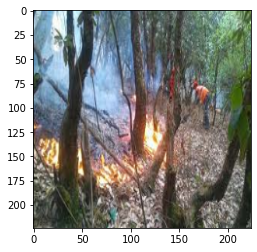

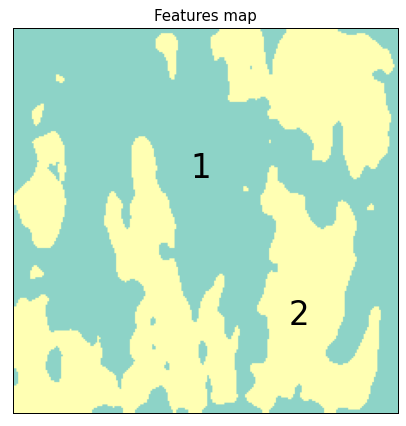

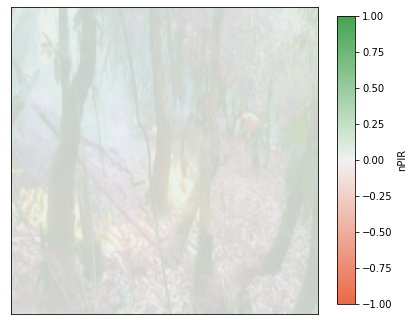

In [54]:
visualize_correlation(980,res)

Le due immagini contenti il pattern "flames/cliff" contengono anche il pattern "flames/volcano", feature assente per gli incendi non riconosciuti dal modello proposto. 